# Introduction
Welcome to Lab 2, in this lab we will take our first steps into applying ML to satellite data, using landcover analysis as our primary goal.

As covered in Lecture 2, landcover classification is the quintessential remote sensing task in the civil sector. The LandSat programme (Lecture 3) was originally developed in large part to enable the USA to monitor landcover more easily for a range of agricultral, govermental and finacial problemsets. It remains a primary task for governments and companies around the world.

This is a pixel-wise ML task. We will apply two methods, both of which are available in GEE as ready-to-go algorithms. In this instance we are happy to go with built-in as it allows us to become familiar with an end-to-end GEE ML workflow without getting bogged down in technical detail. No need to re-invent the wheel unless you are going to the [moon](https://www.nasa.gov/feature/ames/artemis-moon-rover-s-wheels-are-ready-to-roll/).

Remember that this is a set of exercises and tutorials that escalate in difficulty. Always show your working and do not neccesarily expect to get full marks on everything.

Use the resources available to you outside of this material. I expect you to search for concepts or terms you do not understand and to look at the documentation of the code packages that we are using in the first instance of getting stuck. But do then of course ask us for help in the lab and on EdDiscussion.
_______________________________________________________________________________

# Set up

In [ ]:
# Install libs if needed, note the --quiet option means a lot less annoying info than as Lab 1 when we did the same!
!pip install geemap --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 35.6 MB/s eta 0:00:00


In [ ]:
# Set up GEE API
import ee
ee.Authenticate()
ee.Initialize(project='wise-cycling-459404-u1') #<- Remember to change this to your own project's name!

In [ ]:
# Import other libs
import geemap
import geopandas as gpd
import pandas as pd

# Define Area of Interest (AOI)

In [54]:
# Define area of interest (e.g., Wellington, NZ)
aoi = ee.Geometry.Rectangle([174.6, -41.4, 174.9, -41.2])
Map = geemap.Map(center=[-41.3, 174.75], zoom=10)
Map.addLayer(aoi, {}, 'AOI')

# Visualize on the map to check got it right... (always a good idea)
Map

Map(center=[-41.3, 174.75], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright…

# Load and Cloud Mask Imagery from Earth Engine

In [ ]:
# Set up your filter Sentinel-2 imagery
# A function that masks clouds in your S2 images via QA band
def mask_s2_clouds(image):
    qa = image.select('QA60')
    cloudBitMask = 1 << 10 # Opaque
    cirrusBitMask = 1 << 11 # Cirrus
    mask = qa.bitwiseAnd(cloudBitMask).eq(0).And(
           qa.bitwiseAnd(cirrusBitMask).eq(0))
    return image.updateMask(mask).divide(10000).select(['B2', 'B3', 'B4', 'B8'])

# Now build the clean collection with selected bands
s2 = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
      .filterBounds(aoi)
      .filterDate('2021-01-01', '2021-12-31')
      .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 10))
      .map(mask_s2_clouds)
      .median() #<- Taking median pixel values for reduced image
      .clip(aoi)) #clipping imagery to our geometry.

(1) What other mathematical [compositing](https://developers.google.com/earth-engine/guides/ic_composite_mosaic) approaches could you take when building your single image from the filtered image collection you create in the cell above? Hint: you currently are doing a 'median-composite'. (3 pts)

For compositing from an image collection there are several other mathematical reducers available:



*   .mean() -- Average pixel value
*   .Min/Max() -- returns min or max pixel values for each band, useful for indexing


*   .Standard Deviation() -- useful for change detection.

*   .mode() -- most frequently occurring pixel value.
*   .sum() -- sum of pixel values, used for accumulated totals


*   ee.Reducer.percenile() -- for a specified percentile giving more control over the value distribution.


*   .qualityMosaic() -- for selecting pixels with the best value in a QA band.


In [ ]:
# Set up the visualisation and then once again check it has worked, stacking layers in a sensible order
Map = geemap.Map(center=[-41.3, 174.75], zoom=11) #<- reset the map object to clear out other layers from earlier cells
Map.addLayer(s2, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 0.3}, 'S2 RGB')
Map.addLayer(aoi, {'color': 'red'}, 'AOI')
Map

Map(center=[-41.3, 174.75], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright…

________________________________________________________________________________

# Training data

We are going to train our data using the European Space Agency (ESA) world landcover map. Given that this is derived from satellite data our logic is at risk of becoming a little circular here. But as a training exercise it is a good way to have easy to access training data of the right size and type to apply to our image.

There are a wide range of landcover datasets in the GEE catalogue that you can use for this purpose:
*   https://developers.google.com/earth-engine/datasets/tags/landuse-landcover

First, we will load in the landcover map we will use to create our training dataset (https://developers.google.com/earth-engine/datasets/catalog/ESA_WorldCover_v100):



Next we need to use our landcover map to [sample](https://developers.google.com/earth-engine/apidocs/ee-image-sample) the Sentinel 2 image, associating each pixel of a given landcover with the spectral band values 'beneath' it.

In [ ]:
# Define valid WorldCover classes (10 to 100, spaced by 10)
valid_classes = ee.List.sequence(10, 100, 10)

# Need to change this to sequential list to avoid the algs thiniing there are 99 classes rather than 9
remap_to = ee.List.sequence(1, 10)

# Load landcover map
landcover = ee.Image('ESA/WorldCover/v100/2020').select('Map').clip(aoi)

# Remap labels: create a new band with remapped values (10 → 1, ..., 100 → 10)
landcover_remapped = landcover.remap(valid_classes, remap_to).rename('Map_remapped')

(2) What year of data was this landcover map (accessed in the cell above) created on? (1 pt)

Dataset availability via GEE catalog:
2020-01-01–2021-01-01 (2020)

In [ ]:
# Add landcover original and remapped as bands to Sentinel-2 image
training_data = s2.addBands(landcover_remapped).addBands(landcover_remapped)

Let's inspect the resulting training dataset and make sure that you understand what you have built here.

We are going to:
- Print the first few rows (client-side).
- Check the number of samples per class (server-side with reduceColumns).

This may take a little time to run as we request data both client and server side.

In [ ]:
# Sample the image
bands = ['B2', 'B3', 'B4', 'B8']
sample = training_data.select(bands + ['Map_remapped']).sample(
    region=aoi,
    scale=10,
    numPixels=5000,
    seed=2,
    geometries=True)

# Print first 10 sample points (client-side)
first_10 = sample.limit(10).getInfo()

print('\nFirst 10 training samples:')
for i, feature in enumerate(first_10['features']):
    props = feature['properties']
    print(f"Sample {i+1}: Class={props['Map_remapped']}, B2={props['B2']}, B3={props['B3']}, B4={props['B4']}, B8={props['B8']}")

# Count number of samples per class (server-side)
class_counts = sample.reduceColumns(
    reducer=ee.Reducer.frequencyHistogram(),
    selectors=['Map_remapped'])

print('\nClass distribution in sample:')
print(class_counts.getInfo())



First 10 training samples:
Sample 1: Class=8, B2=0.026799999177455902, B3=0.026499999687075615, B4=0.005799999926239252, B8=0.002899999963119626
Sample 2: Class=8, B2=0.039400000125169754, B3=0.028750000521540642, B4=0.0077333333902060986, B8=0.004800000227987766
Sample 3: Class=1, B2=0.01510000042617321, B3=0.03849999979138374, B4=0.02287999913096428, B8=0.23090000450611115
Sample 4: Class=8, B2=0.04749999940395355, B3=0.03200000151991844, B4=0.007666666526347399, B8=0.004550000187009573
Sample 5: Class=1, B2=0.011644444428384304, B3=0.02458333410322666, B4=0.018553845584392548, B8=0.2840000092983246
Sample 6: Class=5, B2=0.10279999673366547, B3=0.09380000084638596, B4=0.09399999678134918, B8=0.12139999866485596
Sample 7: Class=1, B2=0.025599999353289604, B3=0.049800001084804535, B4=0.03869999945163727, B8=0.3140000104904175
Sample 8: Class=8, B2=0.04417499899864197, B3=0.032229166477918625, B4=0.008299999870359898, B8=0.003800000064074993
Sample 9: Class=8, B2=0.03579999879002571, B

(3) What type of landcover is being sampled in sample number 2 of the dataset? Make sure your random seed is set to 2 in the sampling code so that you get the same answer as me. (1 pt)

Sample 2 is identified as Class 8 (80) which corresponds to 'Permanent Water Bodies'.

We are now ready to start machine learning on classifying the landcover of Wellington!
________________________________________________________________________________

# Random Forest Classification for Landcover
Let us do machine learning properly and first apply a 70/20/10 split that allows us to produce some accuracy statistics.

In [ ]:
# Add random column
sample = sample.randomColumn('random')

# Split
train = sample.filter(ee.Filter.lt('random', 0.7))
valid = sample.filter(ee.Filter.And(ee.Filter.gte('random', 0.7), ee.Filter.lt('random', 0.9)))
test = sample.filter(ee.Filter.gte('random', 0.9))

Our next task is to set up a classifier object, followed by applying it to the image using the .classify operator. This operator hides a LOT of behind the scenes plumbing from Google.

We use the [GEE Random Forest](https://developers.google.com/earth-engine/apidocs/ee-classifier-smilerandomforest) model that they have pre-built for us. Specifying the number of trees to use is the only variable we must set. Othe variables are available, read the docs!

In [ ]:
# Train the RF model
classifier = ee.Classifier.smileRandomForest(numberOfTrees=100).train(
    features=train,
    classProperty='Map_remapped',
    inputProperties=bands)

With the model trained, we just apply it simply using the '.classify' operator.

In [ ]:
# Classify image
classified = s2.select(bands).classify(classifier)

Let's visualize what we have just made!

In [59]:
# Classified image viz, fresh set up again to make sure we have exactly what we want displayed.
Map = geemap.Map()
Map.centerObject(aoi, 10)
Map.addLayer(classified.randomVisualizer(), {}, 'Classified')
Map.addLayer(landcover_remapped.randomVisualizer(), {} ,'ESA Landcover')
Map

Map(center=[-41.300046246343555, 174.75000000000097], controls=(WidgetControl(options=['position', 'transparen…

(4) Look at the ESA landcover map and our resulting random forest classified Sentinel 2 image map. How are they different and what might be some causes of this difference? (5 pts)

They use different colours for the classes, with the S2 landcover using a random visualiser. The pixel sizes are the same as they are both derived from S2 imagery, though the S2 classification appears considerably more grainy in certain areas which is likely due to the pixel reflectances being assessed using only a handful of S2 bands (B2,3,4,8), resulting in reduced accuracy compared to the ESA product which used both Sentinel-1 radar data and Sentinel-2 data in addition to spectral indicies like NDVI and whatever else they used according to the product manual. Generally though, the S2 classification has captured fairly similar areas for key classes such as urban, grassland, forest, and water.

Finally, we will apply our test data split and produce the [summary statistics](https://developers.google.com/machine-learning/crash-course/classification/accuracy-precision-recall) that we need to make smart choices about our training approach.

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import pandas as pd


# Validate
validated = valid.classify(classifier, 'predicted')

# Function to export data for confusion matrix
def fc_to_lists(fc, classProp, predProp):
    values = fc.aggregate_array(classProp).getInfo()
    preds = fc.aggregate_array(predProp).getInfo()
    return values, preds

# Get predicted vs actual from validation set
y_true, y_pred = fc_to_lists(validated, 'Map_remapped', 'predicted')

# Labels for original classes
label_map = {i + 1: valid_classes.get(i).getInfo() for i in range(10)}
label_names = [label_map[i + 1] for i in range(10)]

# Confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=list(range(1, 11)))
report = classification_report(y_true, y_pred, labels=list(range(1, 11)), target_names=[str(l) for l in label_names])

# Pretty-print
print("Confusion Matrix:")
print(pd.DataFrame(cm, index=[f"Actual {l}" for l in label_names],
                       columns=[f"Pred {l}" for l in label_names]))
print("\nClassification Report:")
print(report)

Confusion Matrix:
            Pred 10  Pred 20  Pred 30  Pred 40  Pred 50  Pred 60  Pred 70  \
Actual 10       230        1       31        0        2        0        0   
Actual 20         1        0        0        0        0        0        0   
Actual 30        39        0      154        0        4        0        0   
Actual 40         0        0        0        0        0        0        0   
Actual 50         5        0        3        0       23        2        0   
Actual 60         0        0        1        0        2        1        0   
Actual 70         0        0        0        0        0        0        0   
Actual 80         0        0        0        0        6        0        0   
Actual 90         0        0        3        0        0        0        0   
Actual 100        0        0        0        0        0        0        0   

            Pred 80  Pred 90  Pred 100  
Actual 10         0        0         0  
Actual 20         0        0         0  
Actual 30  

(5) Exercise: modify the code so that you feed into your random forest classifier that has been trained on 2020 data, on other years of Sentinel 2 data than 2020. Produce a publication quality figure that presents the following:
*   Landcover maps of Wellington for 2018, 2022 and 2024
*   The Test accuracy averages of the RF classifier for 2020.
*   Include a sentence in your figure caption that explains why you cannot state the accuracy of the classifier for years other than 2020.

(15 pts)
_______________________________________________________________________________


--- 2020 RF Classifier Test Accuracy Averages ---
Overall Accuracy: 0.90
Weighted Avg F1-score: 0.90
--------------------------------------------------


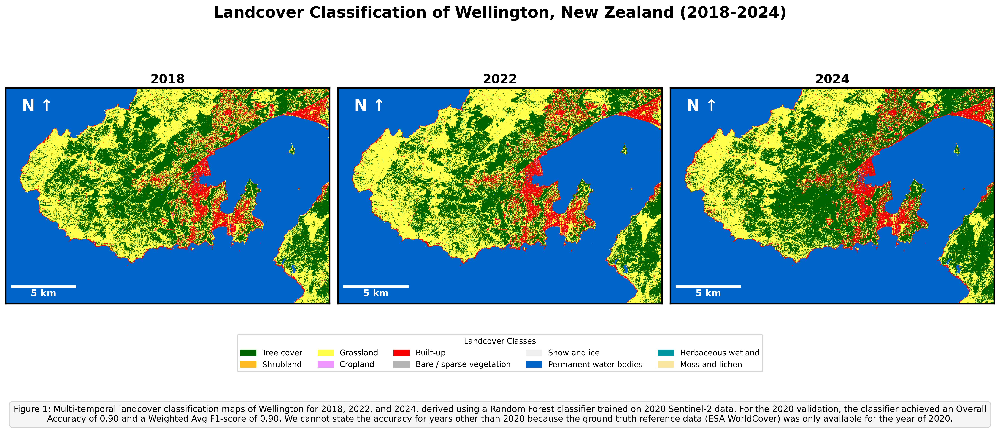

In [ ]:
# Import packages
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request
import matplotlib.patches as mpatches
import matplotlib.font_manager as fm
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import math

# Get image collection for each year, filtered, masked & composited
def get_s2_composite(year):
    start_date = f'{year}-01-01'
    end_date = f'{year}-12-31'
    return (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
            .filterBounds(aoi)
            .filterDate(start_date, end_date)
            .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))
            .map(mask_s2_clouds)
            .median()
            .clip(aoi))

# Resetting assigned bands from earlier
bands = ['B2', 'B3', 'B4', 'B8']

# Call composites for each year
composite_2018 = get_s2_composite(2018)
composite_2022 = get_s2_composite(2022)
composite_2024 = get_s2_composite(2024)

# Classify iterations for each year using the 2020 classifier
classified_2018 = composite_2018.select(bands).classify(classifier)
classified_2022 = composite_2022.select(bands).classify(classifier)
classified_2024 = composite_2024.select(bands).classify(classifier)

# Assign the classes and palettes based on official ESA classes
esa_labels = {
    1: 'Tree cover', 2: 'Shrubland', 3: 'Grassland', 4: 'Cropland', 5: 'Built-up',
    6: 'Bare / sparse vegetation', 7: 'Snow and ice', 8: 'Permanent water bodies',
    9: 'Herbaceous wetland', 10: 'Moss and lichen'
}
esa_palette = ['#006400', '#ffbb22', '#ffff4c', '#f096ff', '#fa0000', '#b4b4b4', '#f0f0f0', '#0064c8', '#0096a0', '#fae6a0']

vis_params = {
    'min': 1,
    'max': 10,
    'palette': esa_palette
}

# Function to fetch images for figure
def fetch_ee_image(ee_image, region, vis_args):
    request_params = dict(
        region=region,
        dimensions=1000,
        format='png',
        **vis_args
    )
    url = ee_image.getThumbURL(request_params)
    return Image.open(urllib.request.urlopen(url))

# Applying fetch function
img_2018 = fetch_ee_image(classified_2018, aoi, vis_params)
img_2022 = fetch_ee_image(classified_2022, aoi, vis_params)
img_2024 = fetch_ee_image(classified_2024, aoi, vis_params)

# Figure
fig, axes = plt.subplots(1, 3, figsize=(18, 8), dpi=300)
images = [img_2018, img_2022, img_2024]
years = ['2018', '2022', '2024']

# Scalebar calculation based on pixel dimensions for S2
coords = aoi.bounds().coordinates().get(0).getInfo()
ll = ee.Geometry.Point(coords[0])
lr = ee.Geometry.Point(coords[1])
width_m = ll.distance(lr).getInfo()
meters_per_pixel = width_m / 1000
scalebar_px = 5000 / meters_per_pixel

fontprops = fm.FontProperties(size=12, weight='bold')

for ax, img, year in zip(axes, images, years):
    ax.imshow(img)
    ax.set_title(year, fontsize=16, weight='bold')
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_edgecolor('black')
        spine.set_linewidth(2)
    ax.text(0.05, 0.95, 'N ↑', transform=ax.transAxes, color='white', fontsize=20, weight='bold', ha='left', va='top')

    scalebar = AnchoredSizeBar(ax.transData,
                               scalebar_px, '5 km', 'lower left',
                               pad=0.5, color='white', frameon=False,
                               size_vertical=6, fontproperties=fontprops)
    ax.add_artist(scalebar)

fig.suptitle("Landcover Classification of Wellington, New Zealand (2018-2024)", fontsize=20, weight='bold', y=0.95)
legend_elements = [mpatches.Patch(color=color, label=name) for color, name in zip(esa_palette, esa_labels.values())]
fig.legend(handles=legend_elements, loc='lower center', bbox_to_anchor=(0.5, 0.12), ncol=5, fontsize=10, title="Landcover Classes")

# Accuracy averages extraction and printing
report_lines = report.splitlines()
overall_acc = report_lines[-3].split()[1]
weighted_f1 = report_lines[-1].split()[-2]

print(f"--- 2020 RF Classifier Test Accuracy Averages ---")
print(f"Overall Accuracy: {overall_acc}")
print(f"Weighted Avg F1-score: {weighted_f1}")
print("--------------------------------------------------")

caption = (
    f"Figure 1: Multi-temporal landcover classification maps of Wellington for 2018, 2022, and 2024, derived using a Random Forest classifier trained on 2020 Sentinel-2 data. "
    f"For the 2020 validation, the classifier achieved an Overall Accuracy of {overall_acc} and a Weighted Avg F1-score of {weighted_f1}. "
    f"We cannot state the accuracy for years other than 2020 because the ground truth reference data (ESA WorldCover) was only available for the year of 2020."
)

fig.text(0.5, 0.02, caption, ha='center', fontsize=11, wrap=True, bbox=dict(boxstyle='round,pad=0.5', facecolor='whitesmoke', edgecolor='lightgray'))
plt.tight_layout(rect=[0, 0.18, 1, 0.92])
plt.show()

# SVMs Applied to Satellite Data

In [ ]:
# Define and train the SVM classifier
class_property = 'Map_remapped'
svm = ee.Classifier.libsvm(kernelType='RBF', gamma=0.5, cost=10).train(
    features=train,
    classProperty=class_property,
    inputProperties=bands
)

# Classify validation and test sets
val_classified = valid.classify(svm)
test_classified = test.classify(svm)

# Evaluate test performance
test_matrix = test_classified.errorMatrix(class_property, 'classification')
print("Confusion Matrix:")
print(pd.DataFrame(cm, index=[f"Actual {l}" for l in label_names],
                       columns=[f"Pred {l}" for l in label_names]))
print("\nClassification Report:")
print(report)

Confusion Matrix:
            Pred 10  Pred 20  Pred 30  Pred 40  Pred 50  Pred 60  Pred 70  \
Actual 10       230        1       31        0        2        0        0   
Actual 20         1        0        0        0        0        0        0   
Actual 30        39        0      154        0        4        0        0   
Actual 40         0        0        0        0        0        0        0   
Actual 50         5        0        3        0       23        2        0   
Actual 60         0        0        1        0        2        1        0   
Actual 70         0        0        0        0        0        0        0   
Actual 80         0        0        0        0        6        0        0   
Actual 90         0        0        3        0        0        0        0   
Actual 100        0        0        0        0        0        0        0   

            Pred 80  Pred 90  Pred 100  
Actual 10         0        0         0  
Actual 20         0        0         0  
Actual 30  

(6) Exercise: train an SVM model using the Landcare NZ 2018 landcover database record for the region. Producing a landcover map of Great Barrier (Aotea) Island for 2018 (based off the Austral summer of 18/19 S2).

Your map should be presented at a publication quality level with all the usual map components (scale, legend, north arrow, data attribution).

You will need to provide performance statistics of the model within your figure.

*   Here you can access the landcover database: https://lris.scinfo.org.nz/layer/104400-lcdb-v50-land-cover-database-version-50-mainland-new-zealand/. You will need to explore for yourself how to extract this data and then upload it to colab, then how to plug it into the SVM algorithim. I have provided some starter code below.

An intial workflow to get the data into the state you need it in to then use it as training data might look like:
- Download the ZIP manually from their browser, having set your area of interest and used the 'Export' tool top right.
- Upload it to Colab.
- Unzip it and load with GeoPandas.
(25 pts)



Note: I used Gemini for a lot of help on this as I kept getting stuck with GEE servers.

In [32]:
# Code to get you started
import zipfile
import geopandas as gpd

# Define paths
zip_path = "/content/lris-lcdb-v50-land-cover-database-version-50-mainland-new-zealand-SHP.zip"
extract_dir = "lcdb"

# Unzip
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# Read the shapefile
shp_path = f"{extract_dir}/lcdb-v50-land-cover-database-version-50-mainland-new-zealand.shp"
gdf = gpd.read_file(shp_path)

print(gdf.columns.tolist())
print(gdf.head())

['Name_2018', 'Name_2012', 'Name_2008', 'Name_2001', 'Name_1996', 'Class_2018', 'Class_2012', 'Class_2008', 'Class_2001', 'Class_1996', 'Wetland_18', 'Wetland_12', 'Wetland_08', 'Wetland_01', 'Wetland_96', 'Onshore_18', 'Onshore_12', 'Onshore_08', 'Onshore_01', 'Onshore_96', 'EditAuthor', 'EditDate', 'LCDB_UID', 'geometry']
           Name_2018          Name_2012          Name_2008          Name_2001  \
0  Indigenous Forest  Indigenous Forest  Indigenous Forest  Indigenous Forest   
1     Sand or Gravel     Sand or Gravel     Sand or Gravel     Sand or Gravel   
2  Indigenous Forest  Indigenous Forest  Indigenous Forest  Indigenous Forest   
3     Sand or Gravel     Sand or Gravel     Sand or Gravel     Sand or Gravel   
4  Indigenous Forest  Indigenous Forest  Indigenous Forest  Indigenous Forest   

           Name_1996  Class_2018  Class_2012  Class_2008  Class_2001  \
0  Indigenous Forest          69          69          69          69   
1     Sand or Gravel          10          1

In [34]:
class_column = 'Name_2018'

# Create a mapping of unique text classes to integers
unique_classes = gdf[class_column].unique()
class_mapping = {name: i + 1 for i, name in enumerate(unique_classes)}

# Apply mapping to a new column
gdf['class_val'] = gdf[class_column].map(class_mapping)

print("Class Integer Mapping:")
for name, val in class_mapping.items():
    print(f"{val}: {name}")

Class Integer Mapping:
1: Indigenous Forest
2: Sand or Gravel
3: Gorse and/or Broom
4: Manuka and/or Kanuka
5: High Producing Exotic Grassland
6: Low Producing Grassland
7: Broadleaved Indigenous Hardwoods
8: Orchard, Vineyard or Other Perennial Crop
9: Built-up Area (settlement)
10: Surface Mine or Dump
11: Exotic Forest
12: River
13: Gravel or Rock
14: Herbaceous Freshwater Vegetation
15: Mangrove
16: Urban Parkland/Open Space
17: Herbaceous Saline Vegetation
18: Estuarine Open Water
19: Lake or Pond
20: Landslide
21: Forest - Harvested
22: Transport Infrastructure


In [37]:
# Reproject to WGS84 and convert to Earth Engine FeatureCollection
gdf_wgs = gdf.to_crs(epsg=4326)
ee_fc = geemap.geopandas_to_ee(gdf_wgs)
roi = ee_fc.geometry().bounds()

# redefine cloudmasking for additional bands
def mask_s2_clouds(image):
    qa = image.select('QA60')
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000)

s2_bands = ['B2', 'B3', 'B4', 'B8', 'B11', 'B12']

# Get the summer collection for GB
s2_summer = (ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
    .filterBounds(roi)
    .filterDate('2018-12-01', '2019-02-28')
    .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))
    .map(mask_s2_clouds)
    .select(s2_bands)
    .median()
    .clip(roi))

# Rasterize the LCDB feature collection using the mapped integer classes
lcdb_image = ee.Image().paint(ee_fc, 'class_val').rename('landcover').toInt()

# Combine S2 bands with landcover band
training_image = s2_summer.addBands(lcdb_image)

# Extract stratified samples
samples = training_image.stratifiedSample(
    numPoints=100,
    classBand='landcover',
    region=roi,
    scale=10,
    geometries=True
)

# Split into sets 80/20
samples = samples.randomColumn()
train = samples.filter(ee.Filter.lt('random', 0.8))
test = samples.filter(ee.Filter.gte('random', 0.8))

print("Feature collection created and sampled.")
print(f"Total samples: {samples.size().getInfo()}")
print(f"Training samples: {train.size().getInfo()}")
print(f"Testing samples: {test.size().getInfo()}")

Feature collection created and sampled.
Total samples: 2140
Training samples: 1706
Testing samples: 434


In [38]:
# Train the SVM classifier
svm = ee.Classifier.libsvm(kernelType='RBF', gamma=0.5, cost=10).train(
    features=train,
    classProperty='landcover',
    inputProperties=s2_bands
)

# Classify the test set to evaluate performance
test_classified = test.classify(svm)
error_matrix = test_classified.errorMatrix('landcover', 'classification')

# Retrieve metrics to the local Colab environment
accuracy = error_matrix.accuracy().getInfo()
kappa = error_matrix.kappa().getInfo()

print("Confusion Matrix:")
print(error_matrix.getInfo())
print(f"\nOverall Accuracy: {accuracy:.4f}")
print(f"Kappa Statistic: {kappa:.4f}")

# Classify s2 composite
classified_image = s2_summer.classify(svm)

#Note: my accuracy was pretty low, I assume this is because of similar spectral reflectances between the classes.

Confusion Matrix:
[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 4, 0, 0, 5, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0], [0, 0, 4, 0, 1, 0, 3, 0, 1, 1, 0, 0, 2, 4, 0, 0, 0, 1, 4, 0, 0, 0, 1], [0, 5, 0, 1, 4, 5, 0, 0, 6, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0], [0, 5, 1, 0, 7, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 10, 3, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1], [0, 1, 0, 1, 1, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 3, 1], [0, 15, 1, 1, 5, 0, 0, 0, 2, 1, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0], [0, 7, 0, 2, 1, 0, 1, 0, 5, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 1, 4, 1, 1, 0, 5, 4, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 13, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0], [0, 3, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 14, 0, 4, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 8, 0, 0, 0, 0, 1, 5, 0, 0, 0, 0], [0, 0, 1, 0, 2, 0, 2, 0, 0, 0, 0, 0, 3, 6, 4, 1, 0, 1,

In [45]:
#The data was too large for GEE server to process so I had to run it through my drive and return it.
import time

# 1. Initiate the batch export task to Google Drive
task = ee.batch.Export.image.toDrive(
    image=classified_image,
    description='Aotea_Landcover_Export',
    folder='EarthEngine_Exports',
    fileNamePrefix='Aotea_Landcover_2018_10m',
    region=roi,
    scale=10,
    maxPixels=1e10
)

task.start()
print("Batch export task started.")

# 2. Monitor task status
while task.active():
    status = task.status()
    print(f"Task state: {status['state']}")
    time.sleep(30)

print(f"Task complete. Final status: {task.status()['state']}")

Batch export task started.
Task state: READY
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task state: RUNNING
Task complete. Final status: COMPLETED


In [46]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Define path to the exported TIFF
out_tif = '/content/drive/MyDrive/EarthEngine_Exports/Aotea_Landcover_2018_10m.tif'

if os.path.exists(out_tif):
    print(f"File located at {out_tif}. Ready to render.")
else:
    print(f"File not found at {out_tif}. Verify the folder name in your Google Drive.")

Mounted at /content/drive
File located at /content/drive/MyDrive/EarthEngine_Exports/Aotea_Landcover_2018_10m.tif. Ready to render.


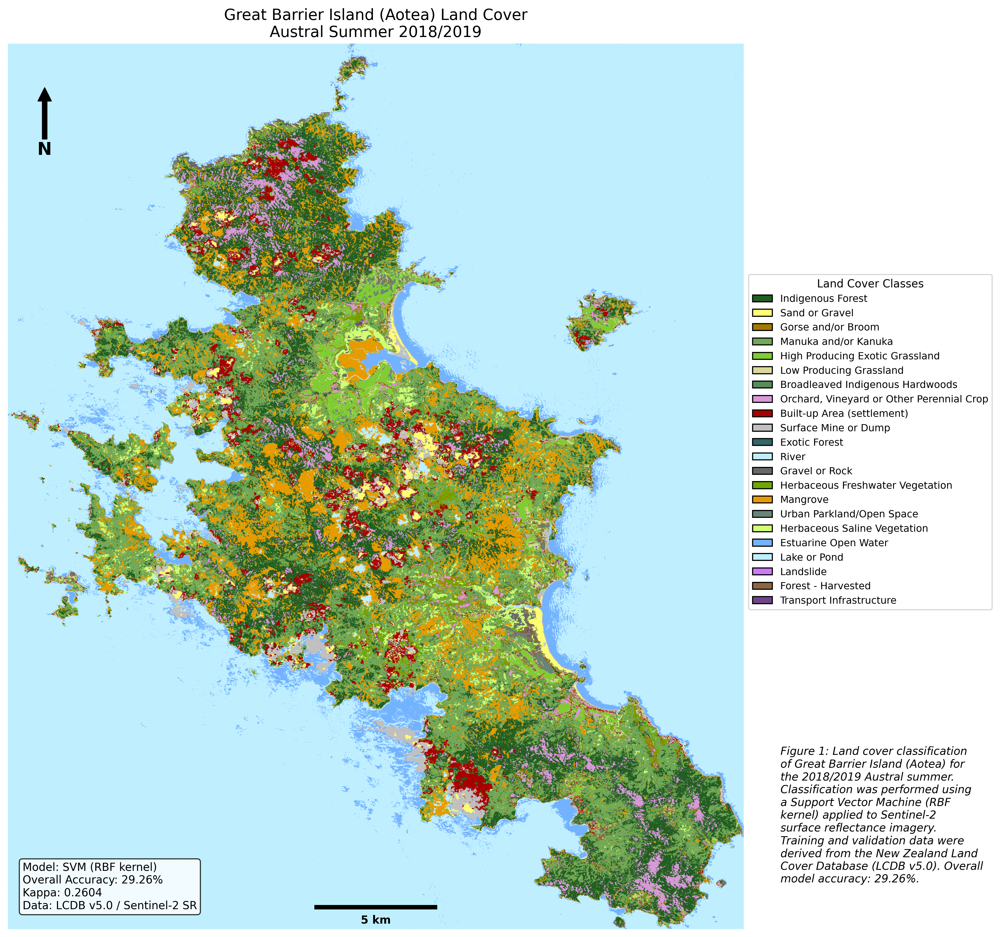

In [58]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
from matplotlib_scalebar.scalebar import ScaleBar
import numpy as np
from IPython.display import Image, display
import textwrap

name_to_hex = {
    "Built-up Area (settlement)": "#A80000",
    "Urban Parkland/Open Space": "#688478",
    "Transport Infrastructure": "#70448A",
    "Surface Mine or Dump": "#C0C0C0",
    "Sand or Gravel": "#FFFF73",
    "Gravel or Rock": "#686868",
    "Landslide": "#CA7BF5",
    "Lake or Pond": "#BFEFFF",
    "River": "#BFEFFF",
    "Estuarine Open Water": "#73B2FF",
    "Mangrove": "#E69C00",
    "Herbaceous Saline Vegetation": "#D1FF73",
    "Herbaceous Freshwater Vegetation": "#70A800",
    "High Producing Exotic Grassland": "#80CC33",
    "Low Producing Grassland": "#D9D999",
    "Broadleaved Indigenous Hardwoods": "#598C59",
    "Indigenous Forest": "#215E21",
    "Exotic Forest": "#336666",
    "Forest - Harvested": "#8C6640",
    "Gorse and/or Broom": "#A37A00",
    "Manuka and/or Kanuka": "#73A857",
    "Orchard, Vineyard or Other Perennial Crop": "#D999D9"
}

inv_class_mapping = {v: k for k, v in class_mapping.items()}
num_classes = len(class_mapping)

hex_list = [name_to_hex.get(inv_class_mapping[i], "#000000") for i in range(1, num_classes + 1)]
cmap = mcolors.ListedColormap(hex_list)
bounds = np.arange(0.5, num_classes + 1.5, 1)
norm = mcolors.BoundaryNorm(bounds, cmap.N)

fig, ax = plt.subplots(figsize=(12, 12))

with rasterio.open(out_tif) as src:
    img = src.read(1)
    img = np.where(img == 0, np.nan, img)

    show(img, transform=src.transform, ax=ax, cmap=cmap, norm=norm)

    meters_per_degree = 10 / src.res[0]

    scalebar = ScaleBar(
        dx=meters_per_degree,
        units="m",
        fixed_value=5,
        fixed_units="km",
        location='lower center',
        frameon=False,
        color='black',
        scale_loc='bottom',
        height_fraction=0.005,
        font_properties={'weight': 'bold', 'size': 10}
    )
    ax.add_artist(scalebar)

ax.annotate('N', xy=(0.05, 0.95), xycoords='axes fraction',
            xytext=(0.05, 0.88), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', width=4, headwidth=12),
            ha='center', va='center', fontsize=16, fontweight='bold')

stats_text = (
    f"Model: SVM (RBF kernel)\n"
    f"Overall Accuracy: {accuracy:.2%}\n"
    f"Kappa: {kappa:.4f}\n"
    f"Data: LCDB v5.0 / Sentinel-2 SR"
)
props = dict(boxstyle='round', facecolor='white', alpha=0.8)
ax.text(0.02, 0.02, stats_text, transform=ax.transAxes, fontsize=10,
        verticalalignment='bottom', bbox=props)

legend_elements = [
    Patch(facecolor=hex_list[i], edgecolor='black', label=inv_class_mapping[i+1])
    for i in range(num_classes)
]

ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.55),
          title="Land Cover Classes", fontsize=9)

ax.set_title("Great Barrier Island (Aotea) Land Cover\nAustral Summer 2018/2019", fontsize=14)
ax.set_axis_off()

# figure caption
caption_raw = (
    "Figure 1: Land cover classification of Great Barrier Island (Aotea) for the 2018/2019 Austral summer. "
    "Classification was performed using a Support Vector Machine (RBF kernel) applied to Sentinel-2 surface "
    "reflectance imagery. Training and validation data were derived from the New Zealand Land Cover Database "
    f"(LCDB v5.0). Overall model accuracy: {accuracy:.2%}."
)
wrapped_caption = textwrap.fill(caption_raw, width=35)

ax.text(1.05, 0.05, wrapped_caption, transform=ax.transAxes,
        verticalalignment='bottom', horizontalalignment='left',
        fontsize=10, style='italic')

plt.tight_layout()
plt.savefig('Aotea_Landcover_Map_10m.png', dpi=300, bbox_inches='tight')

plt.close(fig)
display(Image('Aotea_Landcover_Map_10m.png', width=800))